## Exploratory data analysis

In [1]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [2]:
%cd /gdrive/My Drive/prova_NN

/gdrive/My Drive/prova_NN


In [3]:
import tensorflow as tf
import numpy as np
import os
import random
import pandas as pd
import seaborn as sns
from datetime import datetime
import matplotlib.pyplot as plt
plt.rc('font', size=16)
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')
tf.get_logger().setLevel('ERROR')
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt


tfk = tf.keras
tfkl = tf.keras.layers
print(tf.__version__)

2.7.0


In [4]:
# Random seed for reproducibility
seed = 42

random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)


# general inspection of the data

In [5]:
dataset = pd.read_csv('Training.csv')
print(dataset.shape)
dataset.head(20)

(68528, 7)


,Sponginess,Wonder level,Crunchiness,Loudness on impact,Meme creativity,Soap slipperiness,Hype root
0,7.97698,4.33494,10.67282,1.76692,3.22440,51.681460,3.65434
1,8.07824,4.44616,10.56160,1.70716,3.32566,51.563598,3.47672
2,8.02844,4.22372,10.56160,1.64906,3.17460,50.863080,3.47672
3,8.02844,4.22372,10.56160,1.70716,3.17460,45.841581,3.47672
4,7.87572,4.44616,10.45038,1.70716,3.27586,47.126421,3.47672
5,7.82592,4.22372,10.11672,1.64906,3.12314,47.010218,3.41862
6,7.52214,4.11250,9.89428,1.58930,3.22440,46.892360,3.24100
7,7.31962,4.00128,9.56062,1.53120,3.12314,45.959439,3.24100
8,7.26982,3.89006,9.56062,1.58930,3.02188,47.126421,3.12314
9,7.26982,4.00128,9.56062,1.70716,2.97208,46.659961,3.24100


In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68528 entries, 0 to 68527
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Sponginess          68528 non-null  float64
 1   Wonder level        68528 non-null  float64
 2   Crunchiness         68528 non-null  float64
 3   Loudness on impact  68528 non-null  float64
 4   Meme creativity     68528 non-null  float64
 5   Soap slipperiness   68528 non-null  float64
 6   Hype root           68528 non-null  float64
dtypes: float64(7)
memory usage: 3.7 MB


In [ ]:
dataset.describe()

,Sponginess,Wonder level,Crunchiness,Loudness on impact,Meme creativity,Soap slipperiness,Hype root
count,68528.000000,68528.000000,68528.000000,68528.000000,68528.000000,68528.000000,68528.000000
mean,6.094102,4.695539,13.337485,2.448660,2.407010,23.237929,8.231283
std,1.941639,3.374224,11.703203,3.001798,0.994063,14.298260,11.285101
min,-0.972080,-8.450380,-37.581721,-9.028060,-1.275860,-6.006860,-42.769221
25%,4.791440,2.223420,10.672820,0.468800,2.112200,12.560240,6.604160
50%,5.702780,4.668600,15.676059,2.533840,2.618500,20.151420,10.968300
75%,7.067300,7.115440,20.568080,4.656980,3.021880,31.245199,15.334100
max,15.106680,18.122899,41.138801,14.035980,6.056360,77.371620,31.024420


In [7]:
colors = [
    "blue",
    "orange",
    "green",
    "red",
    "purple",
    "brown",
    "gray",
]

In [8]:
columns = dataset.columns

In [ ]:
def raw_plot(df, columns):
    figs, axs = plt.subplots(len(columns), 1, sharex=True, figsize=(19,25))
    for i, col in enumerate(columns):
        axs[i].plot(df[col],color = colors[i])
        axs[i].set_title(col)
    plt.show()

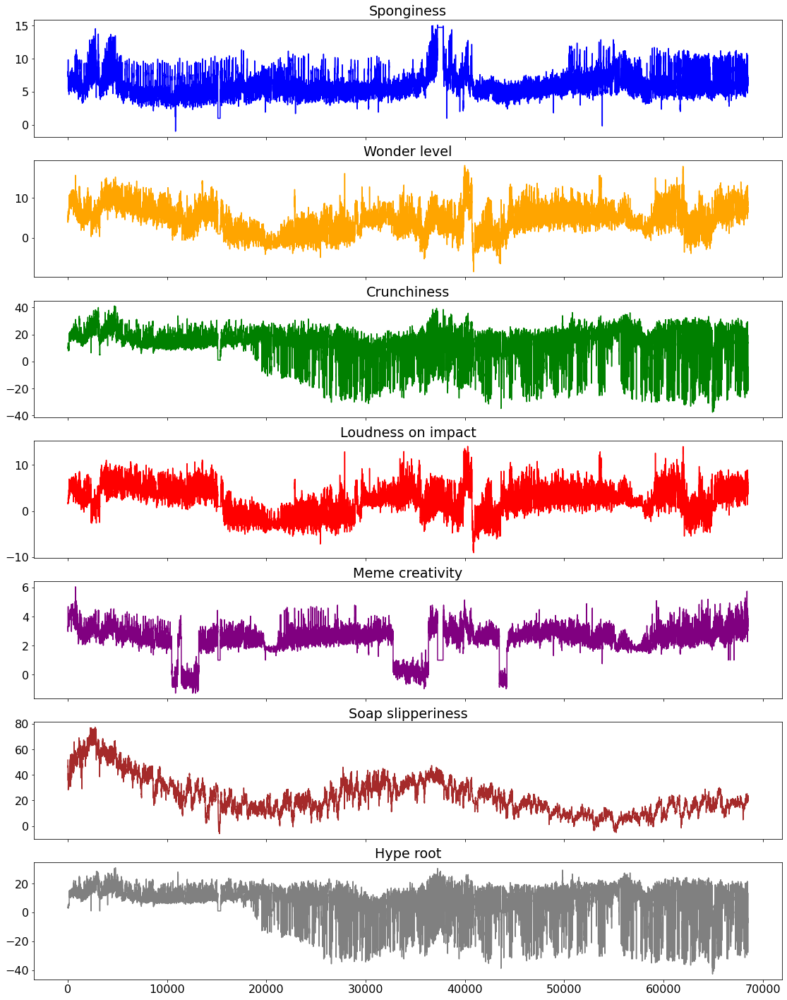

In [ ]:
raw_plot(dataset,dataset.columns)

In [ ]:
dataset.corr()

,Sponginess,Wonder level,Crunchiness,Loudness on impact,Meme creativity,Soap slipperiness,Hype root
Sponginess,1.000000,0.253002,0.297509,0.121744,0.331200,0.127885,0.183141
Wonder level,0.253002,1.000000,0.119078,0.930254,0.367438,0.237021,0.074392
Crunchiness,0.297509,0.119078,1.000000,0.067477,0.029108,0.061539,0.987209
Loudness on impact,0.121744,0.930254,0.067477,1.000000,0.056184,0.229336,0.048806
Meme creativity,0.331200,0.367438,0.029108,0.056184,1.000000,0.078168,-0.040596
Soap slipperiness,0.127885,0.237021,0.061539,0.229336,0.078168,1.000000,0.050996
Hype root,0.183141,0.074392,0.987209,0.048806,-0.040596,0.050996,1.000000


In [ ]:
def corr_heatmap(df):
    plt.matshow(df.corr())
    plt.xticks(range(df.shape[1]), df.columns, fontsize=14, rotation=90)
    plt.gca().xaxis.tick_bottom()
    plt.yticks(range(df.shape[1]), df.columns, fontsize=14)

    cb = plt.colorbar()
    cb.ax.tick_params(labelsize=14)
    plt.title("Correlation Heatmap", fontsize=17)
    plt.show()

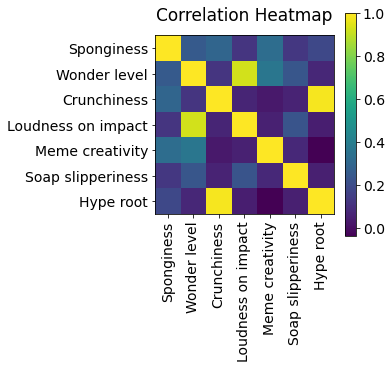

In [ ]:
corr_heatmap(dataset)

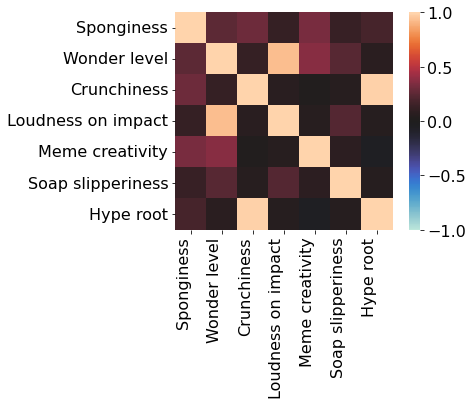

In [ ]:
corr = dataset.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.color_palette("icefire", as_cmap=True),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='right'
);

# Individual series analysis

In [9]:
def ts_plot(y,title,lags=None):
    #examine time series, histogram, ACF, PACF
    fig = plt.figure(figsize=(15,8))
    layout = (2,2)
    ts_ax = plt.subplot2grid(layout,(0,0))
    hist_ax = plt.subplot2grid(layout,(0,1))
    acf_ax = plt.subplot2grid(layout,(1,0))
    pacf_ax = plt.subplot2grid(layout,(1,1))
    y.plot(ax = ts_ax)
    ts_ax.set_title(title,fontsize = 14 ,fontweight = 'bold')
    y.plot(ax = hist_ax, kind = 'hist', bins = 30)
    hist_ax.set_title('histogram')
    smt.graphics.plot_acf(y, lags = lags,ax = acf_ax)
    smt.graphics.plot_pacf(y, lags=lags, ax = pacf_ax)
    [ax.set_xlim(0) for ax in [acf_ax,pacf_ax]]
    sns.despine()
    plt.tight_layout()


In [10]:
import plotly.express as px

def ts_viewer(ds,col):
    fig = px.line(ds,y = ds.columns[col],title =ds.columns[col])
    fig.update_xaxes(rangeslider_visible = True)
    fig.show()

In [11]:
def rolling_stat(df, ts):
    
    # rolling statistics
    rolmean = df[ts].rolling(window = 200, center = False).mean()
    rolstd = df[ts].rolling(window = 200, center = False).std()
    
    # Plot rolling statistics:
    orig = plt.plot(df[ts], 
                    color = 'blue', 
                    label = 'ts')
    mean = plt.plot(rolmean, 
                    color = 'red', 
                    label = 'Roll_avg')
    std = plt.plot(rolstd, 
                   color = 'black', 
                   label = 'Roll_Std')
    plt.legend(loc = 'best')
    plt.title('Rolling Mean & Standard Deviation for %s' %(ts))
    plt.xticks(rotation = 45)
    plt.show(block = False)
    plt.close()

In [12]:
def plot_decomposition(df, ts, trend, seasonal, residual,column):
  """
  Plot time series data
  """
  f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize = (15, 5), sharex = True)

  ax1.plot(ts, label = 'Original')
  ax1.legend(loc = 'best')
  ax1.tick_params(axis = 'x', rotation = 45)

  ax2.plot(df[trend], label = 'Trend')
  ax2.legend(loc = 'best')
  ax2.tick_params(axis = 'x', rotation = 45)

  ax3.plot(df[seasonal],label = 'Seasonality')
  ax3.legend(loc = 'best')
  ax3.tick_params(axis = 'x', rotation = 45)

  ax4.plot(df[residual], label = 'Residuals')
  ax4.legend(loc = 'best')
  ax4.tick_params(axis = 'x', rotation = 45)
  plt.tight_layout()

  # Show graph
  plt.suptitle('Trend, Seasonal, and Residual Decomposition of %s' %(dataset.columns[column]), 
               x = 0.5, 
               y = 1.05, 
               fontsize = 18)
  plt.show()
  plt.close()
  
  return

In [13]:
from statsmodels.tsa.seasonal import seasonal_decompose
def decompose(dataset, dec_dataset, col):
    decomposition = seasonal_decompose(dataset[dataset.columns[col]], freq = 200) 

    dec_dataset.loc[:,'trend'] = decomposition.trend
    dec_dataset.loc[:,'seasonal'] = decomposition.seasonal
    dec_dataset.loc[:,'residual'] = decomposition.resid

    plot_decomposition(df = dec_dataset, 
                    ts = dataset[dataset.columns[col]], 
                    trend = 'trend',
                    seasonal = 'seasonal', 
                    residual = 'residual',column =col)

    rolling_stat(df = dec_dataset.dropna(), ts = 'residual')

**Sponginess**

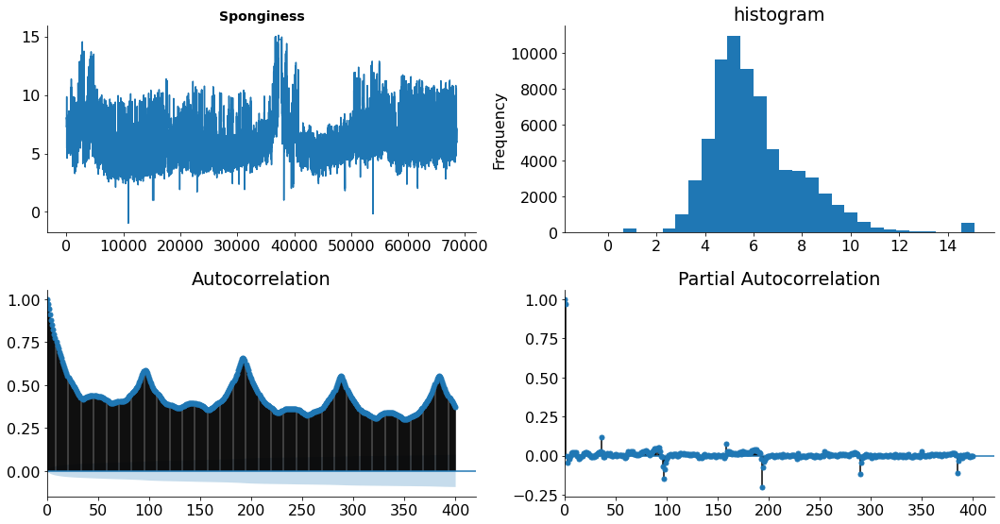

In [ ]:
ts_plot(dataset.iloc[:,0],dataset.columns[0],400)

In [14]:
ts_viewer(dataset,0)

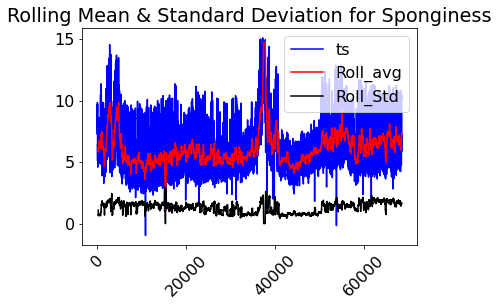

In [ ]:
rolling_stat(dataset, dataset.columns[0])

sponginess is stationary

try detrending with differencing

what to do with the missing data that skews the results?



In [ ]:
sponginess_dec = pd.DataFrame()

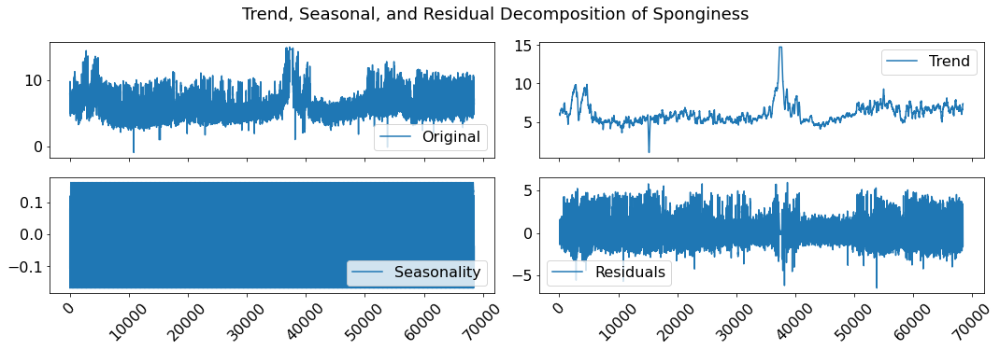

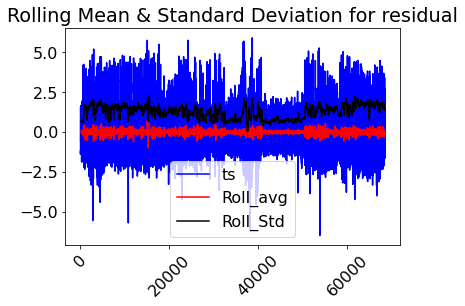

In [ ]:
decompose(dataset,sponginess_dec,0)


there clearly is a pattern visible but it is not stable in the time series, it changes in a couple of forms.

there are also steps in which the data is constant as to fill some sìdata that was lost

the data looks fairly stationary except form a increase in the middle

a couple of possible outliers of value that are negative

markov property?

the seasonality has a period of  arround 200 timesteps 

**Wonder level**

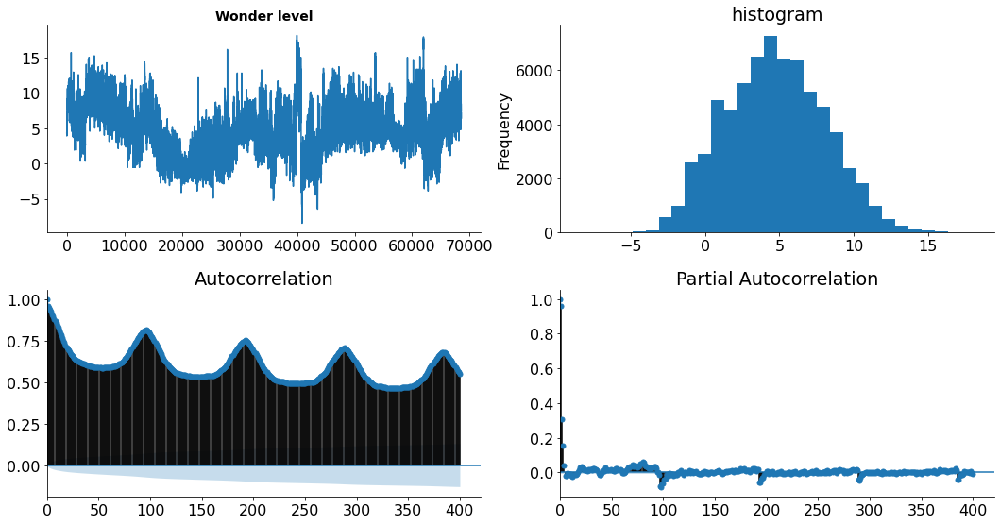

In [ ]:
ts_plot(dataset.iloc[:,1],dataset.columns[1],400)

In [ ]:
ts_viewer(dataset,1)

there histogram shows a normal distribution centered at 5

there seems to be a lag 

there are two distinctive patterns that interchange sometimes

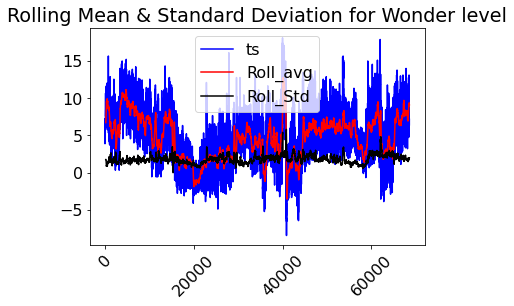

In [ ]:
rolling_stat(dataset, dataset.columns[1])

it is stationary

std ok detrending

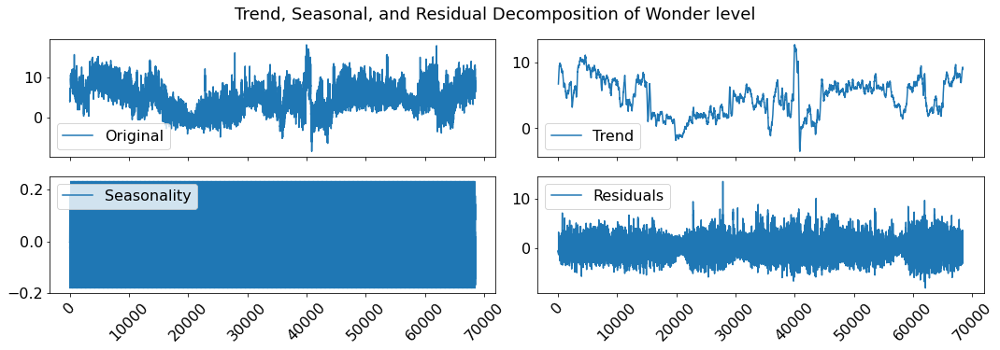

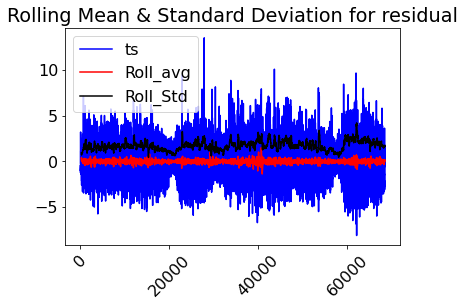

In [ ]:
wonder_dec = pd.DataFrame()
decompose(dataset,wonder_dec,1)

In [ ]:
wonder = pd.DataFrame()

In [ ]:
wonder['diff'] = dataset[dataset.columns[1]].diff()

In [15]:
ts_viewer(wonder,0)

NameError: ignored

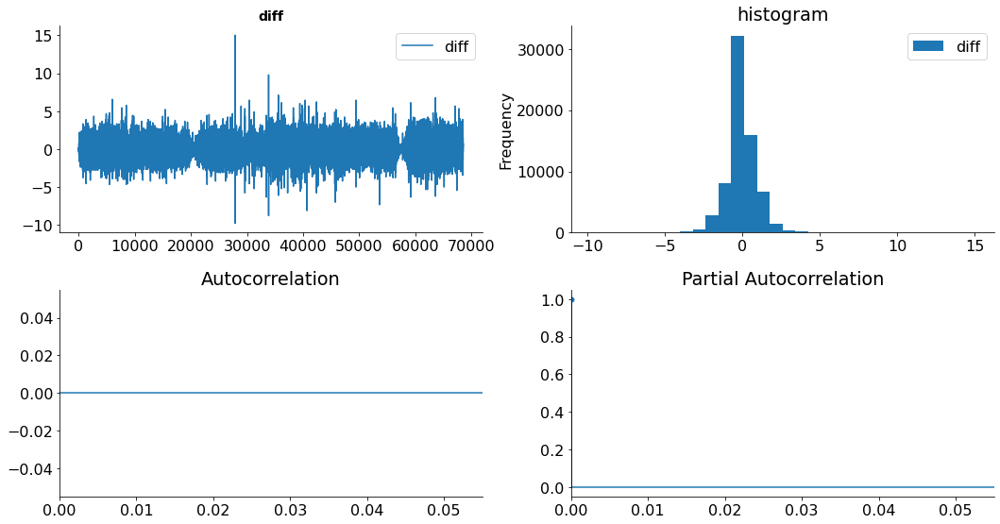

In [ ]:
ts_plot(wonder,'diff',200)

extremly correlated to loudness of impact

**Crunchiness**

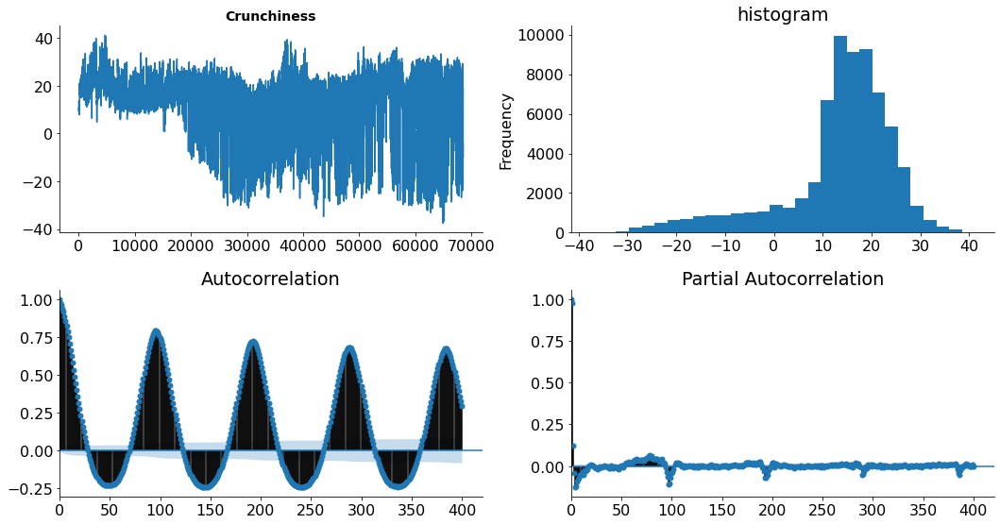

In [ ]:
ts_plot(dataset.iloc[:,2],dataset.columns[2],400)

In [ ]:
ts_viewer(dataset,2)

the histogram is skewes

two distinctive patterns one for half of the data, than the other

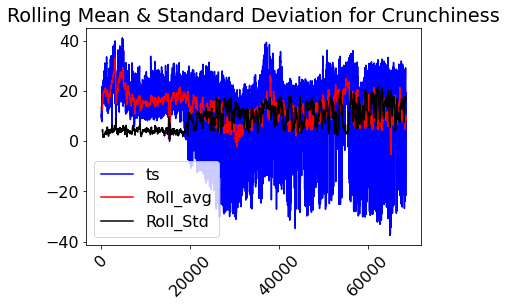

In [ ]:
rolling_stat(dataset, dataset.columns[2])

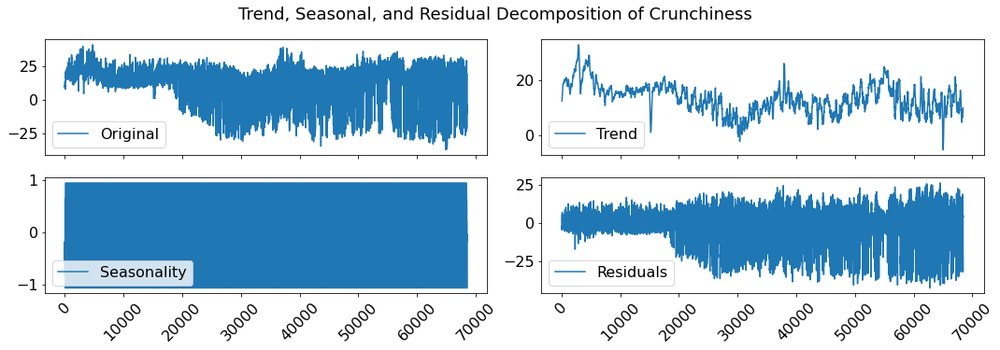

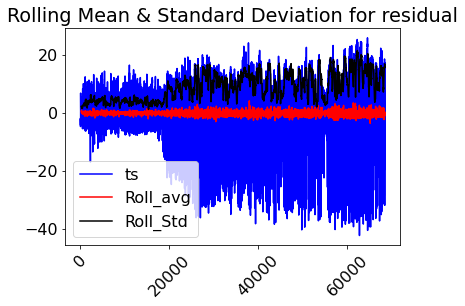

In [ ]:
crunchiness_dec = pd.DataFrame()
decompose(dataset,crunchiness_dec,2)

stationary

try using log to fix std but there is a change in the shape of the pattern so probably wont really work

**Loudness on impact**

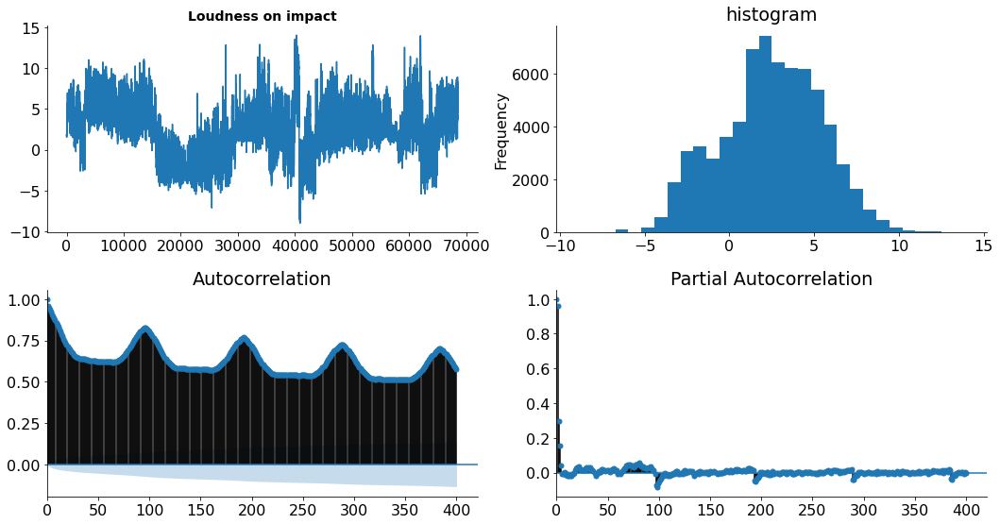

In [ ]:
ts_plot(dataset.iloc[:,3],dataset.columns[3],400)

In [ ]:
ts_viewer(dataset,3)

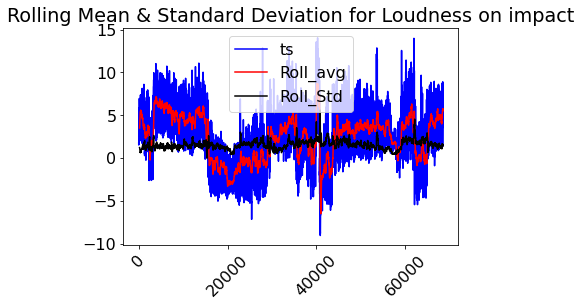

In [ ]:
rolling_stat(dataset, dataset.columns[3])

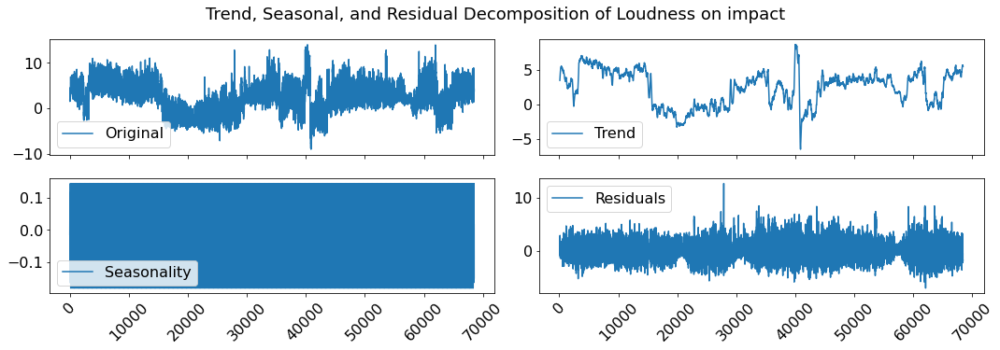

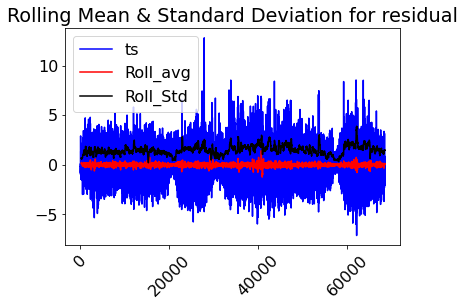

In [ ]:
loi_dec = pd.DataFrame()
decompose(dataset,loi_dec,3)

differencing? the problem are those jumps which will have to be learned

**Meme creativity**

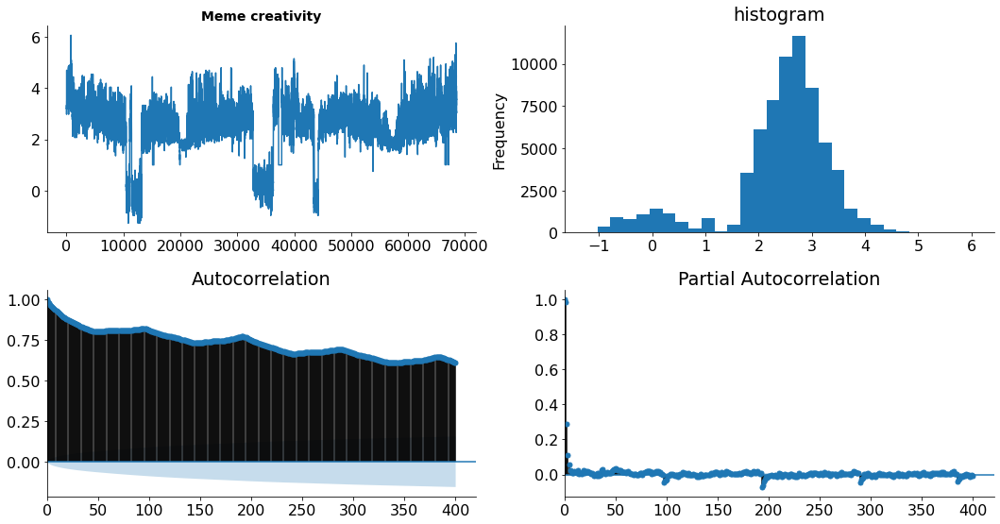

In [ ]:
ts_plot(dataset.iloc[:,4],dataset.columns[4],400)

this has low correlation with other elements of the data and high autocorrelation, maybe try to model it by itself
no peacks in autocorr - more MAlike behaviour

In [ ]:
ts_viewer(dataset,4)

bimodal histogram

there are sudden step changes in the time series

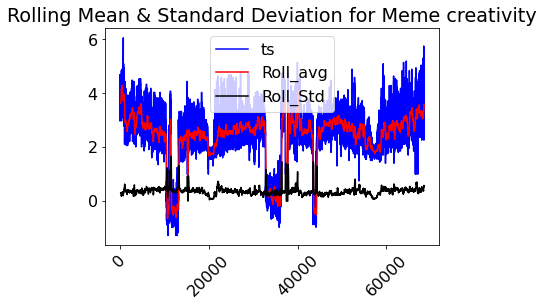

In [ ]:
rolling_stat(dataset, dataset.columns[4])

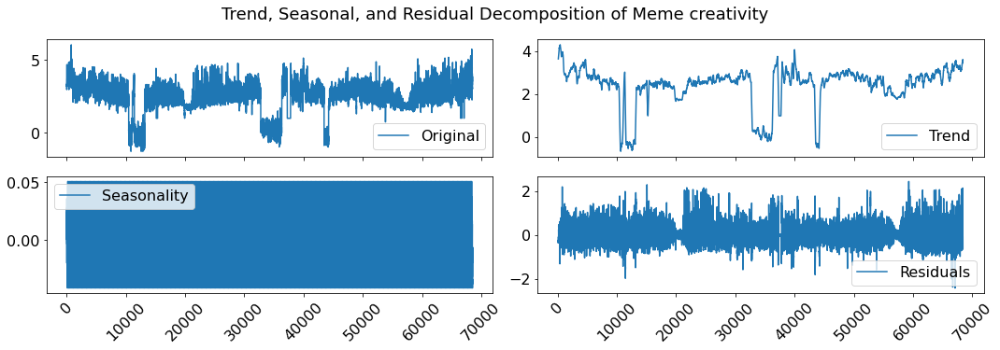

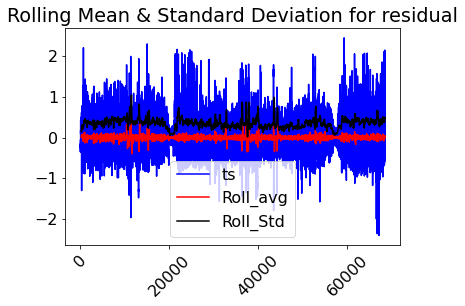

In [ ]:
mc_dec = pd.DataFrame()
decompose(dataset,mc_dec,4)

differencing

**Soap slipperiness**

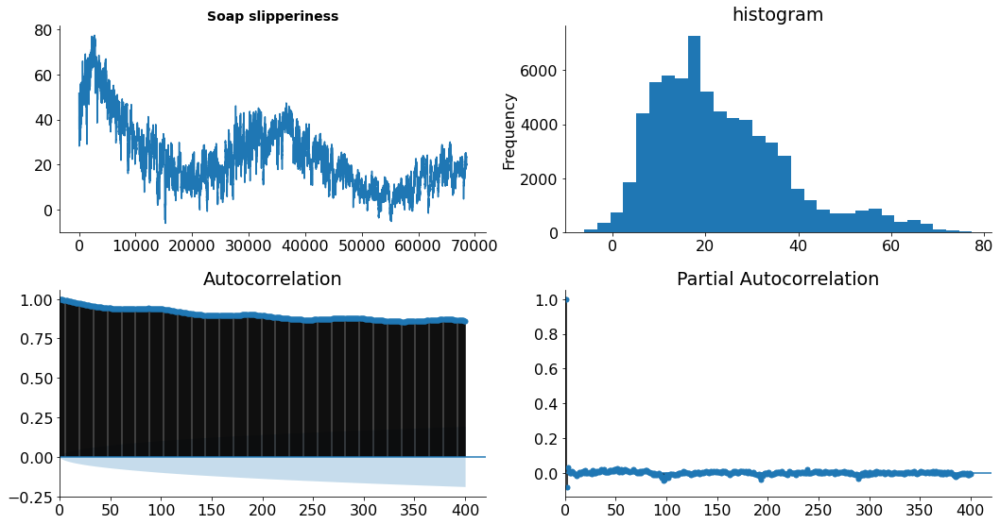

In [ ]:
ts_plot(dataset.iloc[:,5],dataset.columns[5],400)

In [ ]:
ts_viewer(dataset,5)

there is a clear seasonality and trend in the data

the histogramm is not skewed

the low level is very irregular, no clear pattern as in the other cases

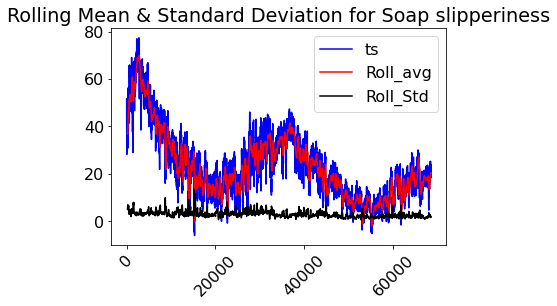

In [ ]:
rolling_stat(dataset, dataset.columns[5])

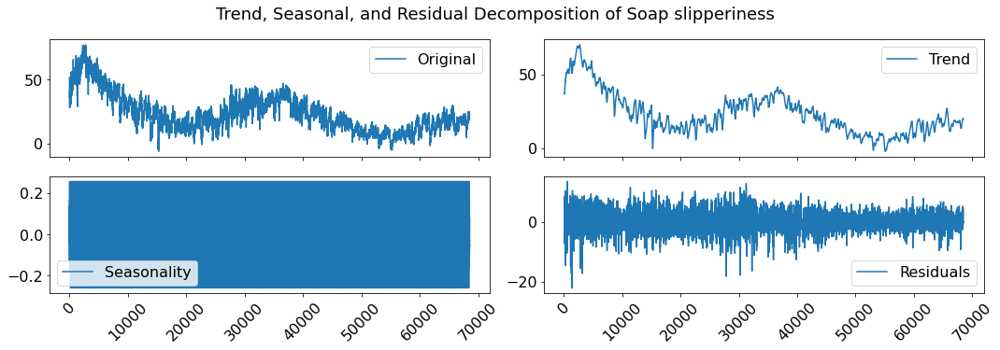

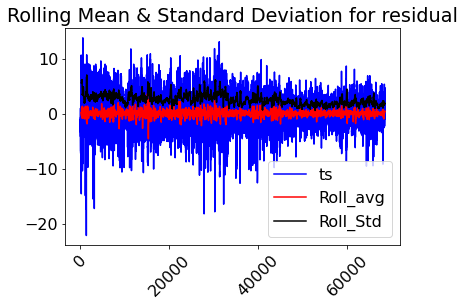

In [ ]:
ss_dec = pd.DataFrame()
decompose(dataset,ss_dec,5)

differencing

In [ ]:
Slipperiness = pd.DataFrame()

In [ ]:
Slipperiness['diff'] = dataset[dataset.columns[5]].diff()

In [ ]:
ts_viewer(Slipperiness,0)

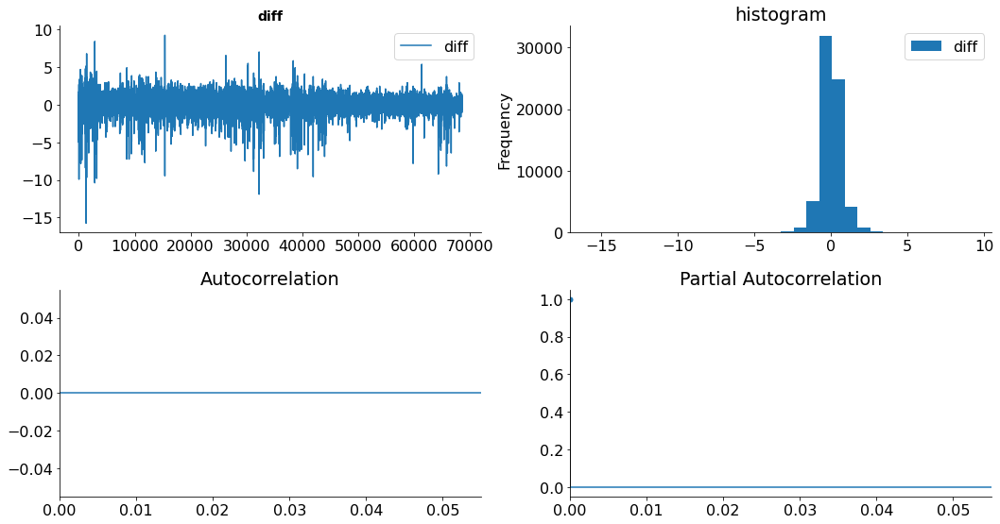

In [ ]:
ts_plot(Slipperiness,'diff',400)

this looks like random noise

**Hype root**

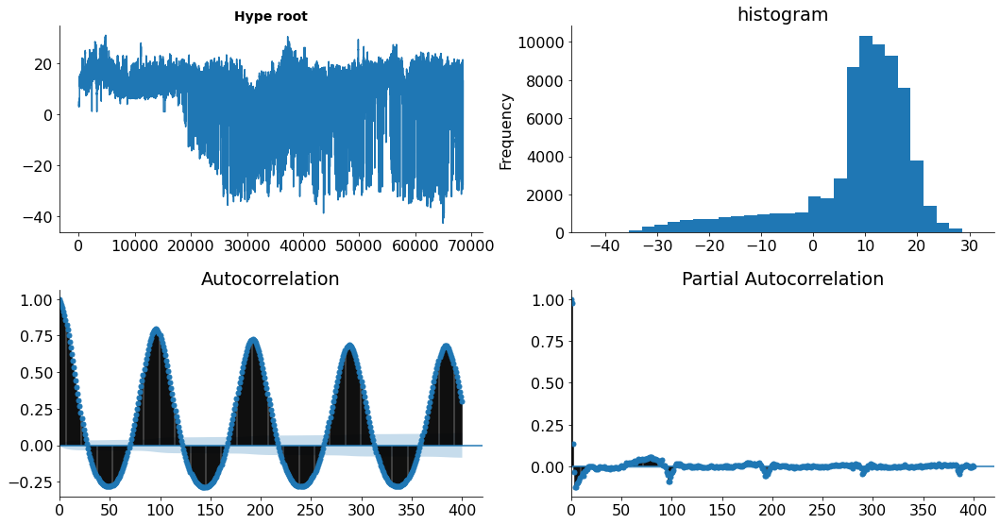

In [ ]:
ts_plot(dataset.iloc[:,6],dataset.columns[6],400)

In [ ]:
ts_viewer(dataset,6)

smilar pattern to crunchiness 

In [ ]:
fig = px.line(dataset,y = dataset.columns[2],title = dataset.columns[2])
fig2 = px.line(dataset,y = dataset.columns[6],title = dataset.columns[6])
fig.update_xaxes(rangeslider_visible = True)
fig2.update_xaxes(rangeslider_visible = True)
fig.show()
fig2.show()

Output hidden; open in https://colab.research.google.com to view.

this seems very similar data



In [ ]:
diff = dataset[dataset.columns[2]] - dataset[dataset.columns[6]]

In [ ]:
difference = pd.DataFrame(diff)

In [ ]:
difference.describe()

,0
count,68528.000000
mean,5.106202
std,1.885097
min,-4.106840
25%,3.886060
50%,4.807360
75%,6.135360
max,15.021341


In [ ]:
ts_viewer(difference,0)

cross_correlation

In [ ]:
ccf = sm.tsa.stattools.ccf(dataset[dataset.columns[2]], dataset[dataset.columns[6]])

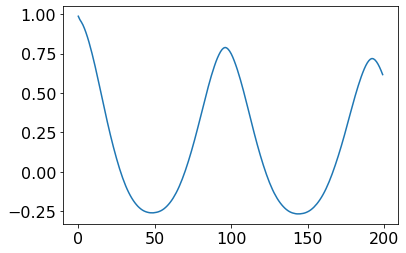

In [ ]:
plt.plot(ccf[:200])

In [ ]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score

In [ ]:
regr = linear_model.LinearRegression()
regr.fit(dataset[dataset.columns[2]].to_numpy().reshape((-1, 1)), dataset[dataset.columns[6]])
pred = regr.predict(dataset[dataset.columns[2]].to_numpy().reshape((-1, 1)))
print('intercept:', regr.intercept_)
print('slope:', regr.coef_)
print("Mean squared error: %.2f" % mean_squared_error(dataset[dataset.columns[2]], pred))
print("R squared: %.2f" % r2_score(dataset[dataset.columns[2]], pred))

intercept: -4.465203638481759
slope: [0.95194009]
Mean squared error: 26.39
R squared: 0.81


should we model this with the others or use one as a predictor of the other, try both if we have time

high cross-correlation but no clear lag

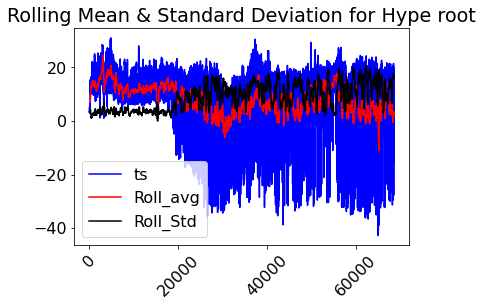

In [ ]:
rolling_stat(dataset, dataset.columns[6])

trying to extract periodicity if any

In [17]:
ACF = pd.DataFrame()

In [18]:
for i in range(dataset.columns.size):
    ACF[i] = sm.tsa.acf(dataset[dataset.columns[i]], nlags=2000)


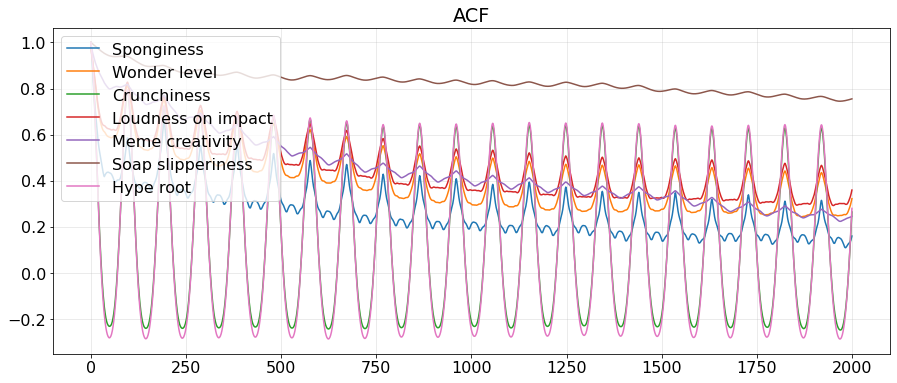

In [ ]:
plt.figure(figsize=(15,6))
for i in range(dataset.columns.size):
    plt.plot(ACF[i], label=dataset.columns[i])
    plt.legend(loc='upper left')
    plt.title('ACF')
    plt.grid(alpha=.3)

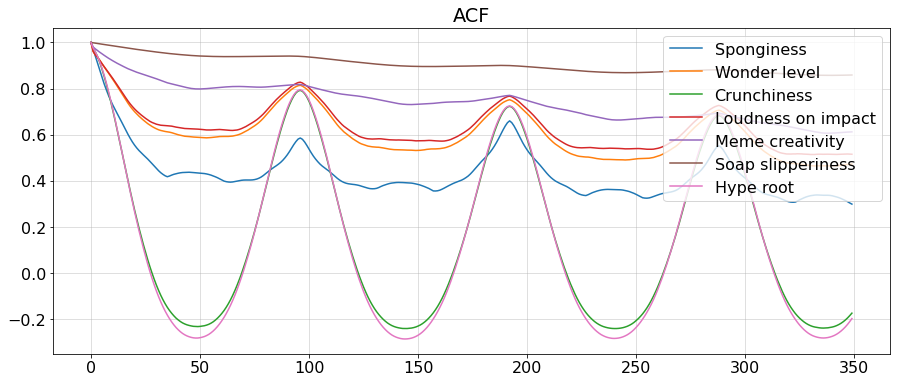

In [21]:
plt.figure(figsize=(15,6))
for i in range(dataset.columns.size):
    plt.plot(ACF[i][:350], label=dataset.columns[i])
    plt.legend(loc='upper right')
    plt.title('ACF')
    plt.grid(alpha=.5)

the most correlated is 96 steps but the values in the interval [90,102] is pretty relevant, maaybe feeding this in the network with a conv on this interval maight be a good idea 

since in the test data we have no reference of time we should train the model feeding the data with a pair of extra attribures that injects a relative tima backward from the present.